In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 

# An Analysis of AirBnB listings in Hawaii

### By: LeeAnn Markwalter and Allyah Harrar
<br>

## Introduction: 
For this project, our group plans on exploring what different factors help determine and contribute to airbnb listing prices in Hawaii. We will be analyzing a company dataset from airbnb.com published for public use. The dataset is a compilation of all current airbnb listings in Hawaii from the company website as of February 10, 2021 and contains 22,031 rows with 16 columns. Each row within the dataset represents a different airbnb listing in Hawaii. Key variables that we will be examining include neighborhood group (specific Hawaiian island), price per night, number of reviews, availability, room type, and number of host listings. We hypothesize to find trends in the data that the more total listings a host has, the less expensive the airbnb will be. This is because hosts with more listing properties have more room, resources, and opportunities that ultimately result in lower prices for guests. Furthermore, we predict that listings advertised as the whole house/ apartment will be the most expensive listing type. Also, we predict to see that the less availability that a listing has, the more expensive it will be due to demand. Finally, we predict that airbnbs located on the main island of Hawaii will be more expensive due to the overall popularity, convenience, and attractions that the main island has to offer.

A direct link to the data can be found here: 
http://data.insideairbnb.com/united-states/hi/hawaii/2021-02-10/visualisations/listings.csv

Company website from which data was retrieved: 
http://insideairbnb.com/get-the-data.html

After thorough analysis, we found that the room type and location of a particular listing were the most significant influencers in determining price. Our initial hypothesis that whole house/apartment listings would be most expensive was supported by our findings. However, we found no correlation or relationship between price and number of listings a host has or price and listing availability. Therefore, our initial guesses that listing availibility and number of host listings would impact price was refuted by our findings. Finally, our hypothesis that Hawaii (big island) would be the most expensive location was found to be incorrect. Instead, we found that Honolulu was the most expensive island to stay on, and Hawaii was the least expensive. 

## Data:

In [5]:
listings = pd.read_csv("listings.csv")
listings

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,5269,Upcountry Hospitality in the 'Auwai Suite,7620,Lea & Pat,Hawaii,South Kohala,20.02740,-155.70200,Entire home/apt,150,3,11,1/2/2021,0.09,4,281
1,5387,Hale Koa Studio & 1 Bedroom Units!!,7878,Edward,Hawaii,South Kona,19.43119,-155.88079,Entire home/apt,85,5,168,3/18/2020,1.25,3,272
2,5389,Keauhou Villa,7878,Edward,Hawaii,North Kona,19.56413,-155.96347,Entire home/apt,239,6,23,1/16/2021,0.26,3,203
3,5434,Kauai Ocean View 3 Story Tiki Tower Princeville,7984,Ahlea,Kauai,North Shore Kauai,22.21972,-159.46958,Entire home/apt,295,2,109,12/12/2020,0.78,2,274
4,7896,"Beachfront Maui Sunset Condo, Kihei/Wailea",21844,Caroline,Maui,Kihei-Makena,20.75470,-156.45666,Entire home/apt,212,4,28,5/11/2018,0.22,1,293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22026,48114053,OCEAN VIEW! Lovely Studio Close to Kahana Beac...,233034188,Leavetown,Maui,Lahaina,20.97126,-156.67874,Entire home/apt,212,2,0,NaN,NaN,78,325
22027,48114068,Perfect Location! Spacious Getaway with Garden...,233034188,Leavetown,Hawaii,South Kohala,19.91681,-155.88127,Entire home/apt,408,2,0,NaN,NaN,78,311
22028,48114108,Sunny Getaway! Relaxing Villa with Garden View...,233034188,Leavetown,Hawaii,South Kohala,19.91575,-155.88256,Entire home/apt,420,2,0,NaN,NaN,78,246
22029,48114166,Near Waikoloa Beach! Spacious and Bright Condo...,233034188,Leavetown,Hawaii,South Kohala,19.91605,-155.88160,Entire home/apt,461,3,0,NaN,NaN,78,333


### Variable Meanings:
* **ID:** the ID number associated with the AirBnB listing
* **Name:** what the listing is called on the AirBnB website
* **Host ID:** The ID number associated with the person listing the AirBnB
* **Host name:** The name of the person(s) renting out the AirBnb
* **Neighbourhood Group:** The name of the particular island in Hawaii that the AirBnB rental is located on
* **Neighbourhood:** The exact neighbourhood the AirBnb rental is located in
* **Latitude:** the Latitude of the listing
* **Longitude:** the longitude of the listing
* **Room type:** The building type of the listing
* **Price:** How much it costs to rent out the AirBnB per night
* **Minimum Nights:** The minimum number of nights the host requires the customer to rent the AirBnB for
* **Number of Reviews:** How may reviews the listing has
* **Last Review:** the date of the last time the AirBnb was reviewed
* **Reviews per Month:** How many reviews the listing recieves per month
* **Calculated Host Listings Count:** How many rental properties the host has available
* **Avaiability 365:** How many days out of the year the listing is avaiable to rent


### Data Analysis Plan 

We will be using **price** as our response y-variable. Explanatory x-variables that will be used are **neighborhood, neighborhood group, room type, number of reviews, calculated host listings, and availability/ 365.** The dataset contains all variables we need to properly explore our research question. Therefore, a comparison group is not applicable for the purposes of this project. 

## Results

### Summary Statistics

In [3]:
average_price = listings["price"].mean()
print ("The average price per night for an airbnb in Hawaii is", average_price)

The average price per night for an airbnb in Hawaii is 389.14479596931596


Finding the average price per night of all AirBnBs in Hawaii gives us a baseline that we can compare specific AirBnBs or future defined AirBnB groups to. 

In [4]:
mode_room_type = listings["room_type"].mode()
mode_room_type
print ("The most common building type listed is", mode_room_type)

The most common building type listed is 0    Entire home/apt
dtype: object


Finding the mode room type tells us what the most common listing type in Hawaii is. We found that the most common room type is the entire home/ apartment which may explain the relatively high average price per night. 

### Initial Findings

In [7]:
pip install folium 

Note: you may need to restart the kernel to use updated packages.


#### Location of Hawaii Airbnbs 

In [10]:
import folium 
from folium.plugins import MarkerCluster 
world_map = folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map) 
for i in range (len(listings)): 
        lat = listings.iloc[i]['latitude']
        long = listings.iloc[i]['longitude']
        radius = 5
        folium.CircleMarker(location = [lat,long], radius=radius, fill =True).add_to(marker_cluster)
world_map

Utilizing latitude and longitude coordinates from our dataset, we were able to graph the specific location for each of the Airbnb listings. Based off of the above visualization, it appears that a majority of the listings are located on the coast of each of their respective islands. This may be because the coasts of Hawaiian islands are more developed and more popular tourist locations. 

#### Distribution of Listings by Island 

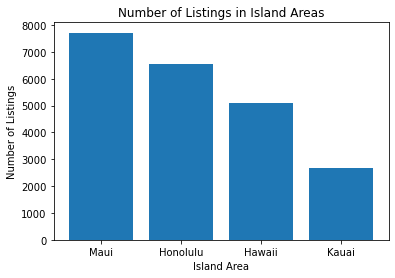

In [12]:
island_table = listings[["neighbourhood_group", "neighbourhood"]]
island_count = island_table.groupby('neighbourhood_group', as_index=False).count()
island_count = island_count.sort_values('neighbourhood', ascending = False)
island_count = island_count.rename(columns={'neighbourhood':'number_of_listings'})
plt.bar(island_count['neighbourhood_group'], island_count['number_of_listings'])
plt.title("Number of Listings in Island Areas")
plt.ylabel("Number of Listings")
plt.xlabel("Island Area")

print()

After seeing a mapped visualization, we graphed a more numerical visualization to see how listing numbers differed from location to location. The above graph depicts the number of listings in each neighborhood group in Hawaii. This helps give us an initial idea where the distribution of airbnbs is throughout Hawaii. As seen in the graph, Maui has the most airbnb listings out of the neighbourhood groups. 

#### Price Distribution

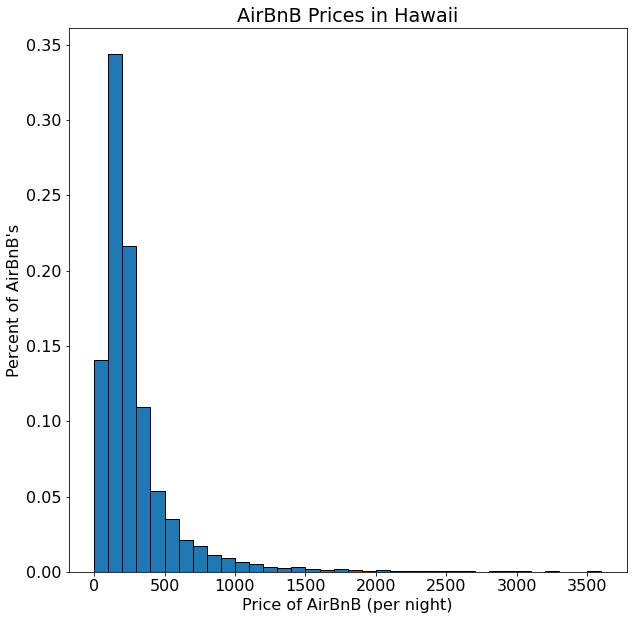

In [13]:
num_rows = len(listings)
multipliers = np.ones(num_rows)/num_rows

plt.figure(figsize=(10,10))
plt.rcParams['font.size'] = '16'

price_dist = plt.hist(listings["price"], edgecolor = 'black', 
               bins = np.arange(0,3700,100), weights = multipliers)
plt.xlabel("Price of AirBnB (per night)")
plt.ylabel("Percent of AirBnB's")
plt.title("AirBnB Prices in Hawaii")
price_dist
print()

The graph above shows the prices of AirBnB's in Hawaii. This helps us visualize the distribution of prices between listings. As you can see, the highest percentage of listings falls between the price range of 300 to 400 dollars. This is consistant with our average cost of $389.14 per night.

### Exploring Our Hypotheses

#### 1) Possible Relationships Between Number of Host Listings and Price 

r = 0.03808071151640083


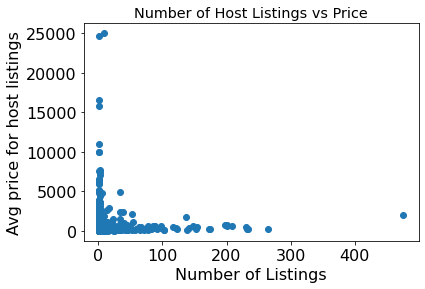

In [14]:
by_host = listings[['host_id', 'price', 'calculated_host_listings_count']]
agg_funcs = {'calculated_host_listings_count':'count', 'price':'mean'}
number_of_listings = by_host.groupby('host_id', as_index=False).agg(agg_funcs)
plt.scatter(number_of_listings['calculated_host_listings_count'], number_of_listings['price'])
plt.rcParams['font.size'] = '12'
plt.title("Number of Host Listings vs Price")
plt.xlabel('Number of Listings')
plt.ylabel('Avg price for host listings')

corr_matrix = np.corrcoef(number_of_listings['calculated_host_listings_count'], number_of_listings['price'])
r = corr_matrix[0][1]
print("r =", r)

The above visualization shows the relationship between the number of listings that each unique host has and the average price of those listings. Based off of the scatter plot, there appears to be no significant relationship between the two variables. Furthermore, the calculated correlation coefficient between the two variables was found to be .038. Since this value is so close to 0, we can reasonably assume that there is no apparent correlation between the number of listings a host has and the average price of their listings. In other words, the number of listings a host has does not seem to affect the price of their listings. However, there do appear to be some outliers in the visualization. Perhaps these outliers are affecting the overall relationship between the variables. The analysis may be improved by eliminating those outliers. These findings do not support our original hypothesis that the more listings a host has, the less expensive their listings will be. This may be because other variables such as location or type of listing have a much larger impact on price than number of host listings. These factors will be explored in later analyses. 

#### 2) Possible Relationships Between Listing Availability and Price 

r =  -0.06980879431981798


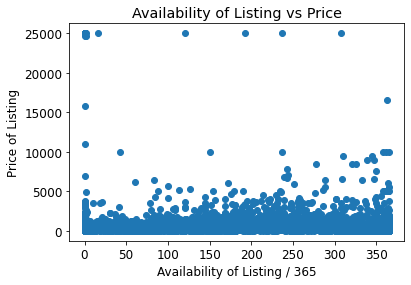

In [34]:
plt.scatter(listings['availability_365'], listings['price'])
plt.rcParams['font.size'] = '12'
plt.title("Availability of Listing vs Price")
plt.xlabel('Availability of Listing / 365')
plt.ylabel('Price of Listing')
corr_matrix_2 = np.corrcoef(listings['availability_365'], listings['price'])
r_2 = corr_matrix_2[0][1]
print("r = ", r_2)

The scatter plot above graphs the number of days each listing is available out of the year versus the price of the listings. When looking for initial trends in the graph, there appears to be no signifcant relationship between the two variables. Furthermore, the calculated r value of -.06 does not suggest any correlation. Availabilty of listings throughout the year does not appear to play a significant role in determing the price of that same listing.  Similar to the previous scatter plot, the analysis could be improved by eliminating outliers. The lack of correlation found does not support our hypothesis that limited availability will create higher demand and therefore drive price increases. 

#### 3) Comparing Average Listing Price Between Hawaiian Islands

(0.0, 450.0)

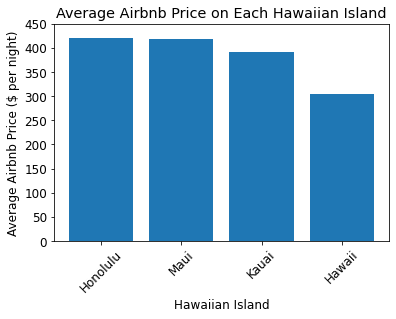

In [33]:
grouped_neighbourhood = listings.groupby("neighbourhood_group", as_index=False).mean()
grouped_neighbourhood = grouped_neighbourhood.sort_values(by='price', ascending =False)
grouped_neighbourhood
plt.rcParams['font.size'] = '12'
plt.xticks(rotation = 45) 
plt.bar(grouped_neighbourhood['neighbourhood_group'],grouped_neighbourhood['price'])
plt.title("Average Airbnb Price on Each Hawaiian Island")
plt.ylabel("Average Airbnb Price ($ per night)")
plt.xlabel("Hawaiian Island")
plt.ylim(0, 450)



This graph shows the average price for an Airbnb according to which island a guest would like to stay on. The chart reveals the most expensive island to stay on is Honolulu, which averages out to 420.33 per night. The cheapest island to stay on would be Hawaii (The Big Island) and airbnb's on this island cost an average of 304.06 per night. This does not support our hypothesis that the Hawaiian Big Island would have the most expensive listings, in fact the Hawaiian Big Island has the cheapest listings out of all of the islands. As we can see though, the island does have an impact on the price of the Airbnb listing as we predicted.

#### 4) Comparing Average Listing Price by Room Type 

Text(0.5, 0, 'Room Type')

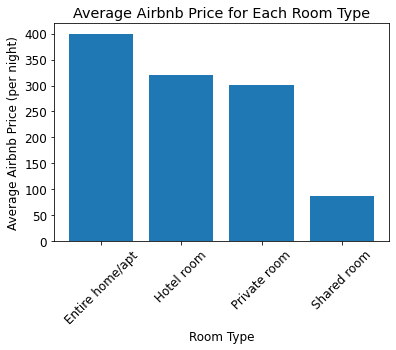

In [32]:
grouped_type = listings.groupby("room_type", as_index=False).mean()
grouped_type
plt.rcParams['font.size'] = '12'
plt.xticks(rotation = 45) 
plt.bar(grouped_type['room_type'],grouped_type['price'])
plt.title("Average Airbnb Price for Each Room Type")
plt.ylabel("Average Airbnb Price (per night)")
plt.xlabel("Room Type")


The graph above displays the average AirBnB prices of each type of housing unit available to rent. It shows that renting out an entire home is the most expensive option which costs an average of 399.79 dollars per night, and the cheapest option is to rent out a shared room for an average cost of 86.64 dollars per night. This is consistent with our hypothesis in which we predicted that listings advertised as the whole house/ apartment will be the most expensive listing type.

#### 5) Count of Room Types by Island

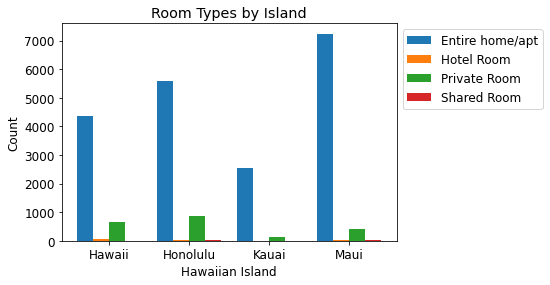

In [31]:
island_room = pd.crosstab(listings["neighbourhood_group"], columns=listings["room_type"])
island_room = island_room.reset_index().rename_axis(None,axis="columns")
bar_width = 0.2
color1_starts = np.arange(4)
color2_starts = color1_starts + bar_width 
color3_starts = color2_starts +bar_width
color4_starts = color3_starts + bar_width 
label_ticks = (color1_starts + color2_starts + color3_starts + color4_starts) / (4)
plt.rcParams['font.size'] = '12'
fig, ax = plt.subplots()

plt.bar(color1_starts, island_room["Entire home/apt"], width = bar_width)
plt.bar(color2_starts, island_room["Hotel room"], width = bar_width)
plt.bar(color3_starts, island_room["Private room"], width = bar_width)
plt.bar(color4_starts, island_room["Shared room"], width = bar_width)

plt.title("Room Types by Island")
plt.xlabel("Hawaiian Island")
plt.ylabel("Count")
plt.legend(["Entire home/apt", "Hotel Room", "Private Room", "Shared Room"],loc='upper left', bbox_to_anchor=(1.0, 1.0))
ax.set_xticks(label_ticks) 
ax.set_xticklabels(island_room['neighbourhood_group'])
print()

The above visualization graphs the number of each room type available throughout all the listings on the four different island areas. Listings where the entire home/apt is made available is the most common listing type across each of the islands by far. Referring back to graph 4, it was found that the entire home/apt listing type had the highest average price per night. The entire home/apt listing type appears to be a major cost driver in determining the average price of an airbnb listing in Hawaii and its respective islands. If we saw a decline in the number of entire home/apt listing types or an increase in the number of other listing types, then we would expect the overall average price of a listing to go down. 

## Conclusion

To conclude, island location and room type were found to be the most significant factors in affecting the price per night of airbnb listings in Hawaii. We found listings in Honolulu to be most expensive, whereas listings located on the Hawaii big island were cheapest. The higher price of Honolulu listings may be attributed to Honolulu being the state's capital, and thus has a higher tourist and travel demand. Furthermore, listings advertised as entire home/ apartment were found to be the most expensive room type, whereas shared room was the least expensive. This result was expected considering entire homes contain many more amenities, resources, and space than the other room types. Given that an overwhelming majority of listings were entire home/ apartment, this appears to be the most significant cost driver in determining the average price per night of all air bnb listings ($389.14).

If given more time, it would be interesting to explore what factors affect prices across all vacation rental domains in Hawaii, not just airbnbs. This would require a dataset that contained listing data for hotels, resorts, and rental homes not listed as airbnbs. We could analyze this data to see if the same findings hold true across all vacation rentals in Hawaii. Furthermore, it would be interesting to obtain more specific information about the listings such as number of bedrooms, number of bathrooms, and square footage. Utilizing these more specifc physical characteristics, we could analyze if property size has any significant effect on price.  